In [16]:
import matplotlib.pyplot as plt

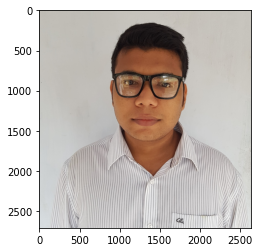

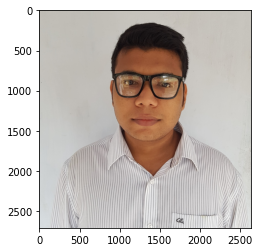

In [17]:
tamiti = plt.imread("/content/drive/MyDrive/images/Tarikul Islam Tamiti.jpg")
plt.imshow(tamiti)

Text(0.5, 1.0, 'RGB')

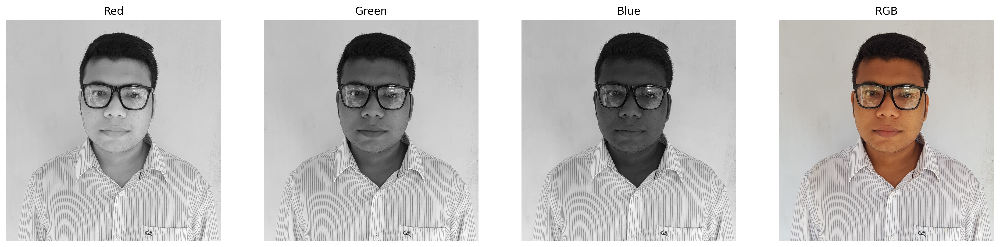

Text(0.5, 1.0, 'RGB')

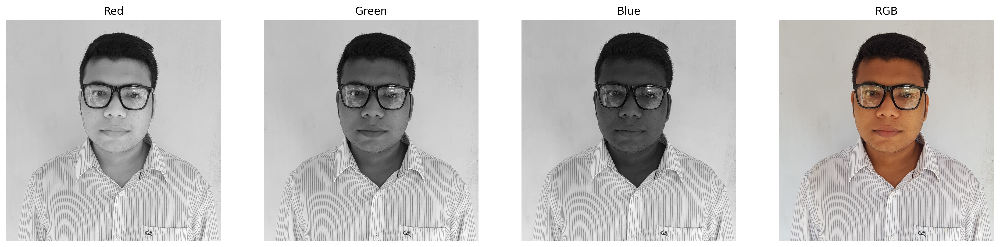

In [18]:
a,subplot=plt.subplots(1,4,figsize=(20,10),dpi=400)
subplot[0].imshow(tamiti[:,:,0],cmap='gray')
subplot[0].axis('off')
subplot[0].set_title("Red")

subplot[1].imshow(tamiti[:,:,1],cmap='gray')
subplot[1].axis('off')
subplot[1].set_title("Green")

subplot[2].imshow(tamiti[:,:,2],cmap='gray')
subplot[2].axis('off')
subplot[2].set_title("Blue")

subplot[3].imshow(tamiti[:,:,],cmap='gray')
subplot[3].axis('off')
subplot[3].set_title("RGB")

In [19]:
r = tamiti[:,:,0]
g = tamiti[:,:,1]
b = tamiti[:,:,2]

In [20]:
def histogram(image):
    
    dictionary = {}
    
    for i in range(0, 256):
        dictionary[i] = 0
        
    for i in range(0, image.shape[0]):
        for j in range(0, image.shape[1]):
            dictionary[image[i][j]] = dictionary[image[i][j]] + 1
        
    pixel = []
    frequency= []
    
    for i in range(0, 256):
        pixel.append(i)
        frequency.append(dictionary[i])
        
    plt.plot(pixel, frequency)

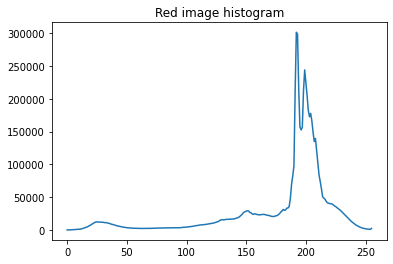

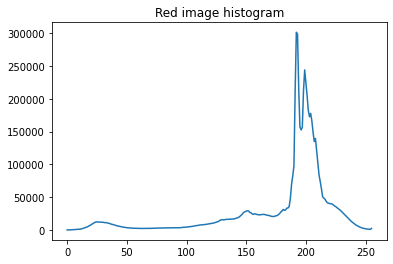

In [21]:
plt.title('Red image histogram')
histogram(r)

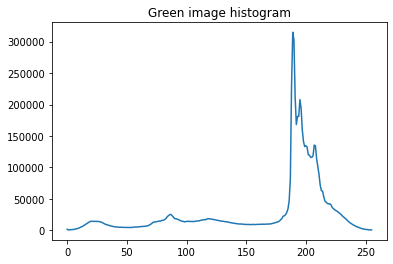

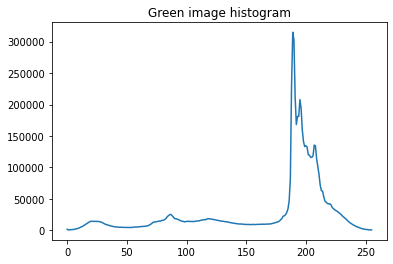

In [22]:
plt.title('Green image histogram')
histogram(g)

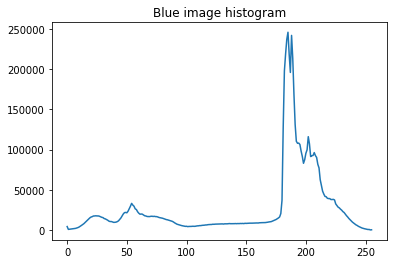

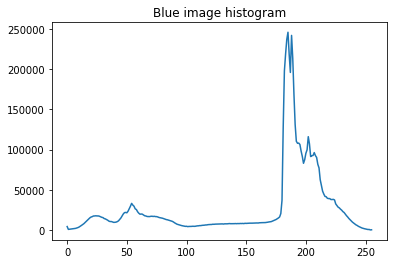

In [23]:
plt.title('Blue image histogram')
histogram(b)

In [24]:
def threshold(image,value):
    
    temp = image.copy()
    
    for i in range(0, image.shape[0]):
        for j in range(0, image.shape[1]):
            if( image[i][j] <= value ):
                temp[i][j] = 0
            else:
                temp[i][j] = 255
                
    return temp

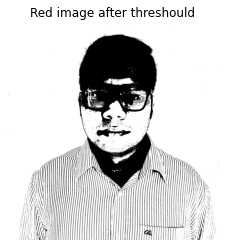

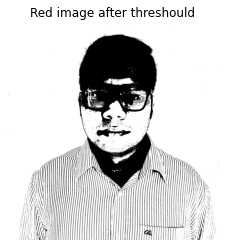

In [25]:
n_r = threshold(r, 150)
plt.title('Red image after threshould')
plt.axis('off')
plt.imshow(n_r, cmap="gray")

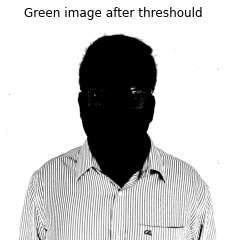

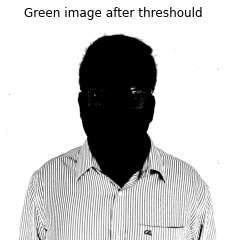

In [26]:
n_g = threshold(g, 175)
plt.title('Green image after threshould')
plt.axis('off')
plt.imshow(n_g, cmap="gray")

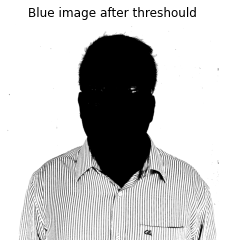

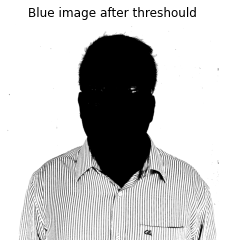

In [27]:
n_b = threshold(b, 175)
plt.title('Blue image after threshould')
plt.axis('off')
plt.imshow(n_b, cmap="gray")

In [28]:
def merge_images(r, g, b):
    
    img = r.copy()
    
    for i in range(0, r.shape[0]):
        for j in range(0, r.shape[1]):
            if( r[i][j] == 255 and g[i][j] == 255 and b[i][j] == 255 ):
                img[i][j] = 255
            else:
                img[i][j] = 0
                
    return img

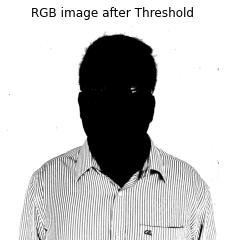

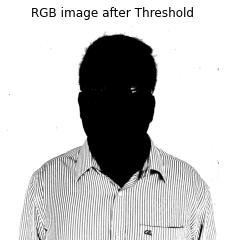

In [29]:
merged_image = merge_images(n_r, n_g, n_b)
plt.title('RGB image after Threshold')
plt.axis('off')
plt.imshow(merged_image, cmap="gray")

Text(0.5, 1.0, 'Image after removing back ground')

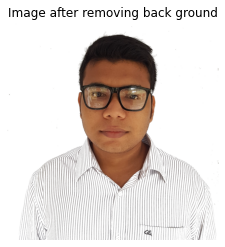

Text(0.5, 1.0, 'Image after removing back ground')

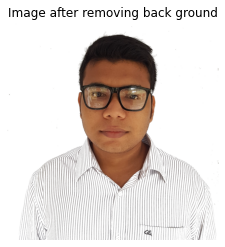

In [30]:
temp = tamiti.copy()
    
for i in range(0, tamiti.shape[0]):
    for j in range(0, tamiti.shape[1]):
        if( merged_image[i][j] == 255 ):
            temp[i][j] = 255
            
plt.imshow(temp)
plt.axis('off')
plt.title('Image after removing back ground')

(2711, 2634, 3)

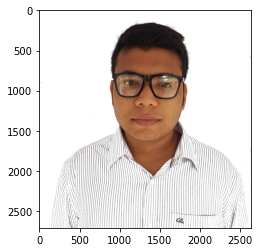

In [58]:
import cv2

resize_image = cv2.resize(temp,None, fx = 1, fy = 1, interpolation = cv2.INTER_NEAREST)

plt.imshow(resize_image)
resize_image.shape

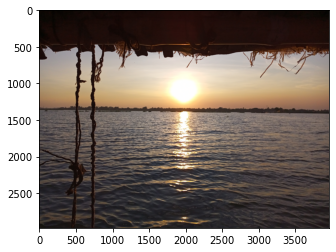

In [59]:
background = plt.imread("/content/drive/MyDrive/images/Background.jpg")
plt.imshow(background)

In [60]:
background.shape


(2976, 3968, 3)

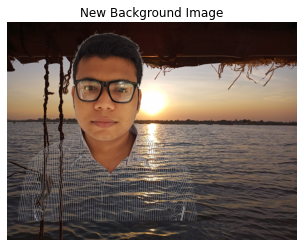

In [61]:
combine_img = background.copy()

for i in range(0, resize_image.shape[0]):
    for j in range(0, resize_image.shape[1]):
            if( resize_image[i][j][0] != 255 and resize_image[i][j][1] != 255 and resize_image[i][j][2] != 255 ):
                combine_img[i][j] = resize_image[i][j]
                
plt.axis('off')
plt.title('New Background Image')
plt.imshow(combine_img)